In [1]:
from datetime import datetime
import yfinance as yf
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

colours = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

name = 'SPY'

from_beginning = '1987-01-01'
start_date = from_beginning
df = yf.download(name, start=start_date)
df = df[['Adj Close']].copy()
df['Return'] = df['Adj Close'].pct_change().fillna(0)

# set time here
today = datetime.now()
last_10_years = f'{today.year - 9}-01-01'
last_20_years = f'{today.year - 19}-01-01'
last_30_years = f'{today.year - 29}-01-01'
start_date = f'1900-01-01'
choices = [last_10_years, last_20_years, last_30_years, start_date]

[*********************100%%**********************]  1 of 1 completed


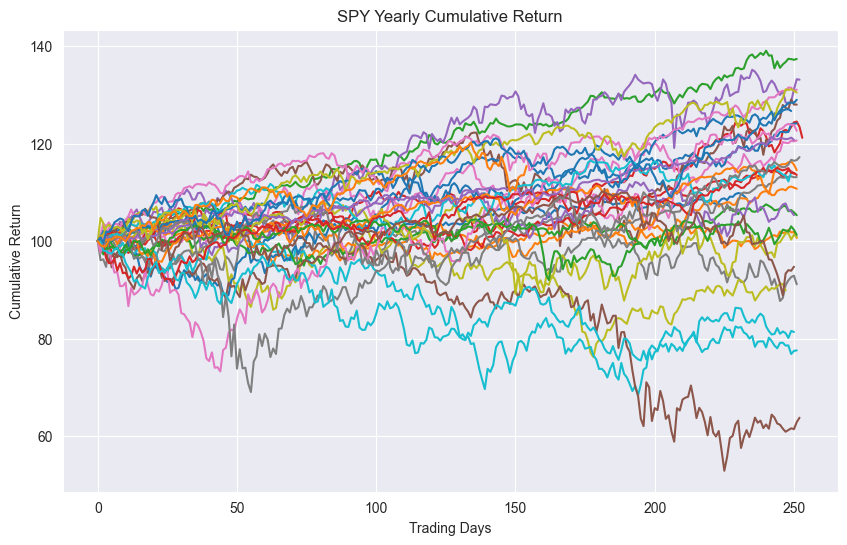

In [6]:
all_years = []

plt.figure(figsize=(10, 6))
for _df in df['Adj Close'].groupby(df.index.year):
    temp_df = _df[1] / _df[1].iloc[0]
    
    if _df[1].index[0].year != 2024:
        all_years.append((temp_df * 100).values.tolist())
        
    plt.plot((temp_df * 100).values.tolist())
    plt.ylabel('Cumulative Return')
    plt.xlabel('Trading Days')
    plt.title(f'{name} Yearly Cumulative Return')

In [7]:
min([len(y) for y in all_years])

234

Returns by Weekday

In [9]:
week_df = df['Return'].groupby(df.index.weekday).describe()
week_df.index = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
week_df['mean / std'] = week_df['mean'] / week_df['std']
week_df

,count,mean,std,min,25%,50%,75%,max,mean / std
Monday,1491.0,0.000474,0.013001,-0.109424,-0.003855,0.000641,0.006002,0.145197,0.036428
Tuesday,1630.0,0.000747,0.011804,-0.052786,-0.004692,0.000506,0.006345,0.116856,0.063318
Wednesday,1629.0,0.000498,0.011219,-0.098448,-0.004390,0.000823,0.006020,0.059662,0.044404
Thursday,1600.0,0.000217,0.011747,-0.095677,-0.004582,0.000677,0.005799,0.062340,0.018488
Friday,1591.0,0.000349,0.011028,-0.057192,-0.004560,0.000727,0.005674,0.085486,0.031685


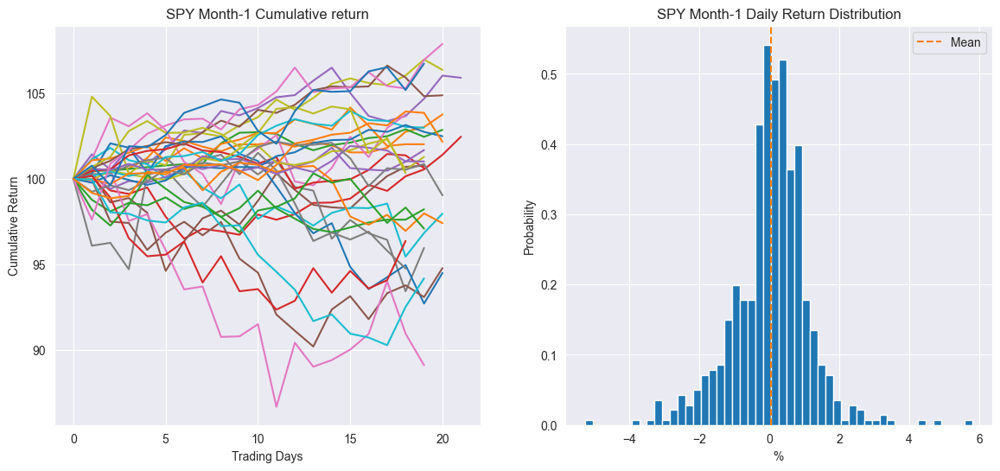

Mean: 0.03453580936941758, Std: 1.095336263204682
Skewness: -0.11615557027982812, Kurtosis: 3.413551236646983
Jarque-Bera test p-value: 2.348920115364642e-66
p_value < 0.05, the distribution is likely not normal


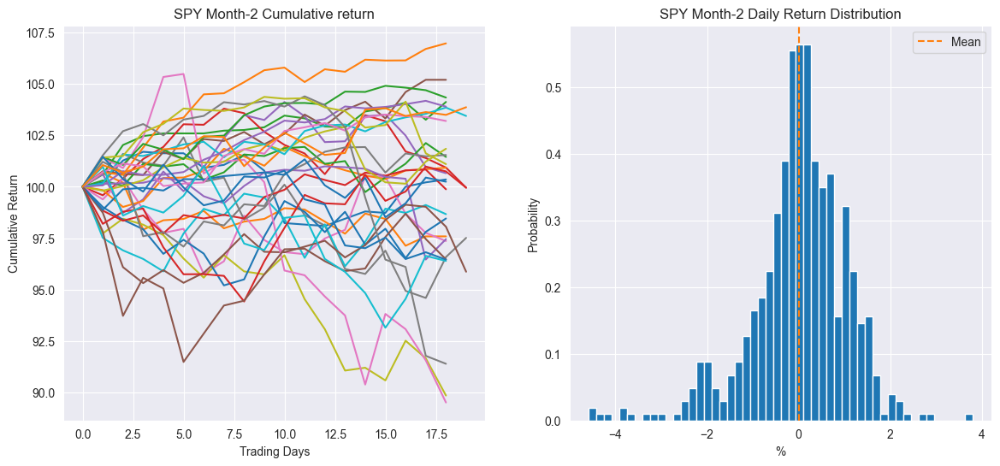

Mean: 0.004394005607834897, Std: 1.045418927768112
Skewness: -0.8694382032985537, Kurtosis: 2.5187363359256505
Jarque-Bera test p-value: 7.61517377232747e-52
p_value < 0.05, the distribution is likely not normal


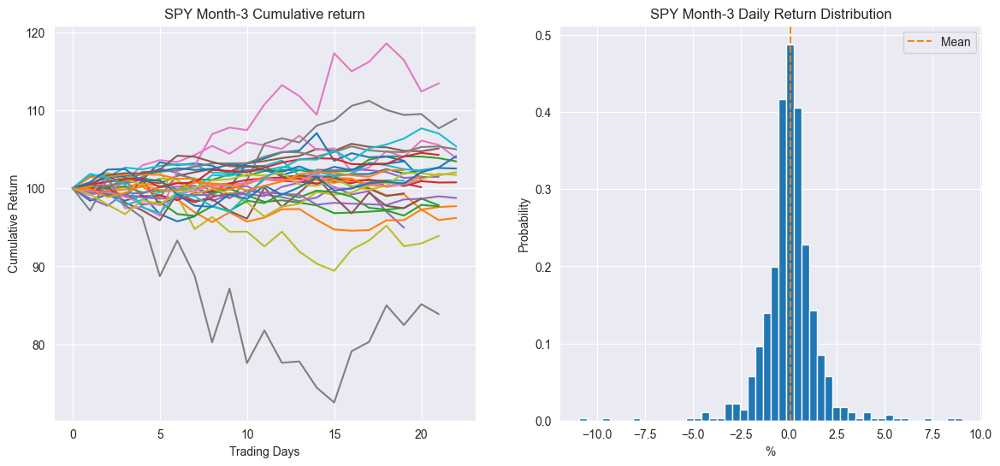

Mean: 0.06780381559125566, Std: 1.4930861997117093
Skewness: -0.2959794903769276, Kurtosis: 12.312908633203232
Jarque-Bera test p-value: 0.0
p_value < 0.05, the distribution is likely not normal


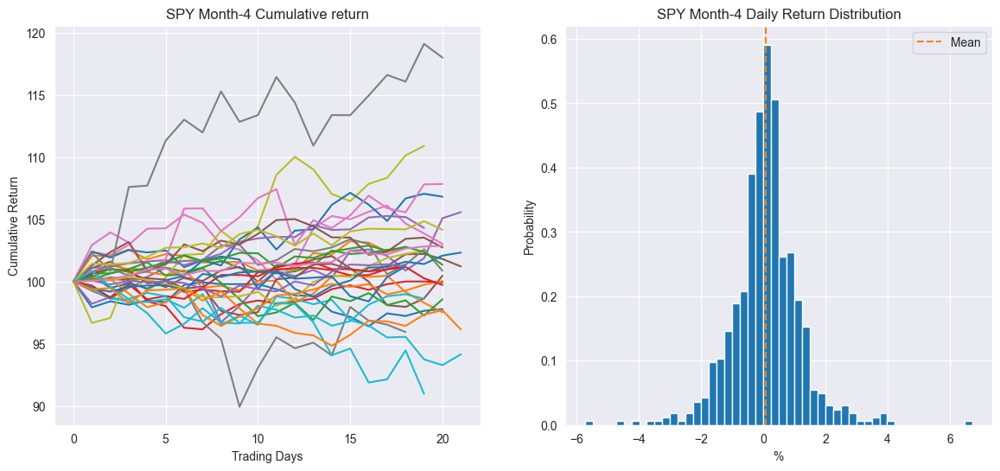

Mean: 0.08932557896200118, Std: 1.1134978039928352
Skewness: 0.1171371062320863, Kurtosis: 4.505393015933902
Jarque-Bera test p-value: 5.8864877475328236e-120
p_value < 0.05, the distribution is likely not normal


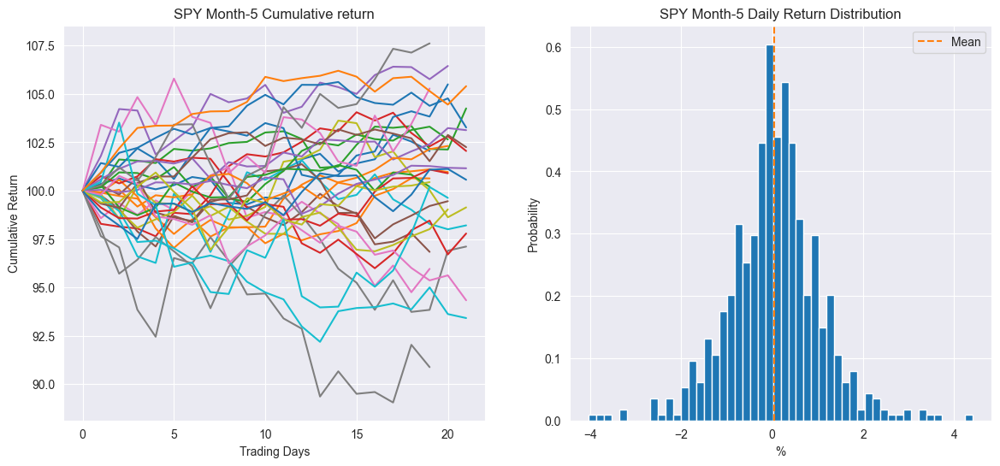

Mean: 0.04521183109904989, Std: 1.010230084880598
Skewness: -7.774433707329844e-05, Kurtosis: 1.8913515881736243
Jarque-Bera test p-value: 4.1034256288118986e-22
p_value < 0.05, the distribution is likely not normal


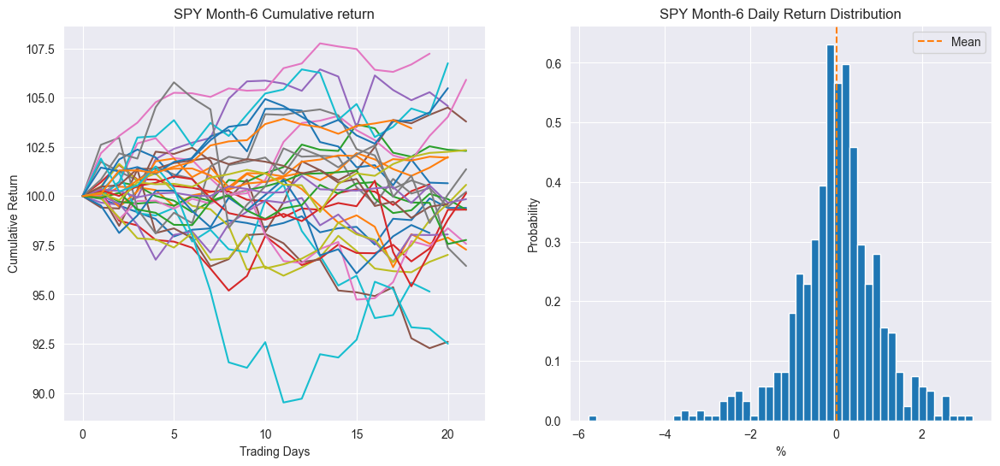

Mean: 0.017389404493363497, Std: 1.0014310397529573
Skewness: -0.6298674494537372, Kurtosis: 2.845202350119424
Jarque-Bera test p-value: 2.150880475344071e-59
p_value < 0.05, the distribution is likely not normal


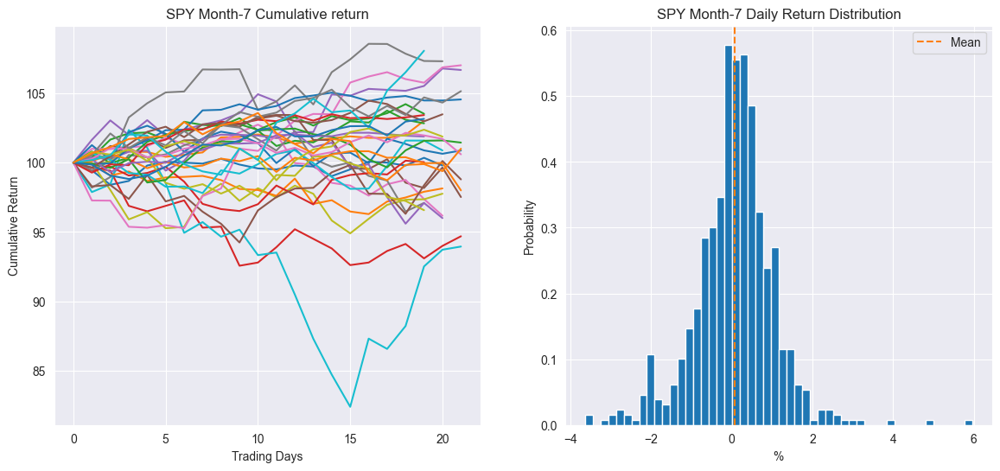

Mean: 0.06889263544561357, Std: 0.9897668614335237
Skewness: 0.12156828404893008, Kurtosis: 3.6635927386991267
Jarque-Bera test p-value: 1.8644030195298023e-81
p_value < 0.05, the distribution is likely not normal


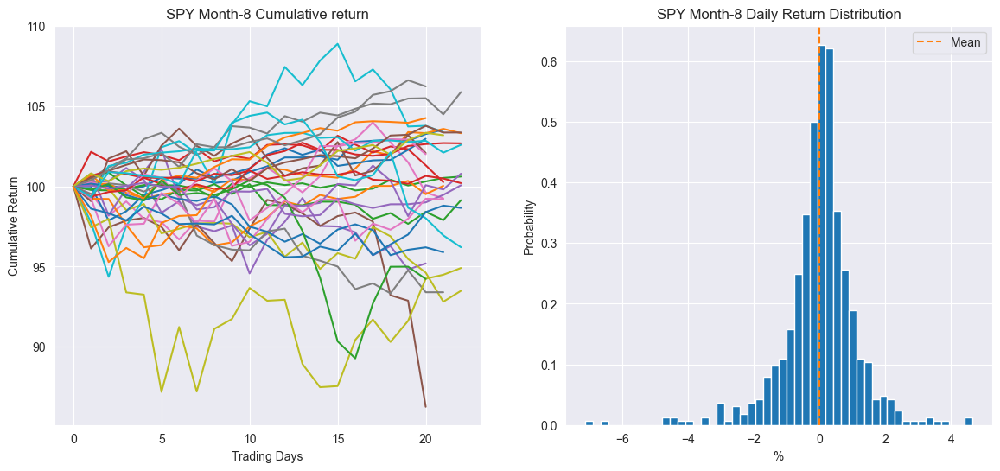

Mean: -0.007168215390382869, Std: 1.1314508580750668
Skewness: -0.9425689355901018, Kurtosis: 6.216386082403735
Jarque-Bera test p-value: 1.3583495437829105e-262
p_value < 0.05, the distribution is likely not normal


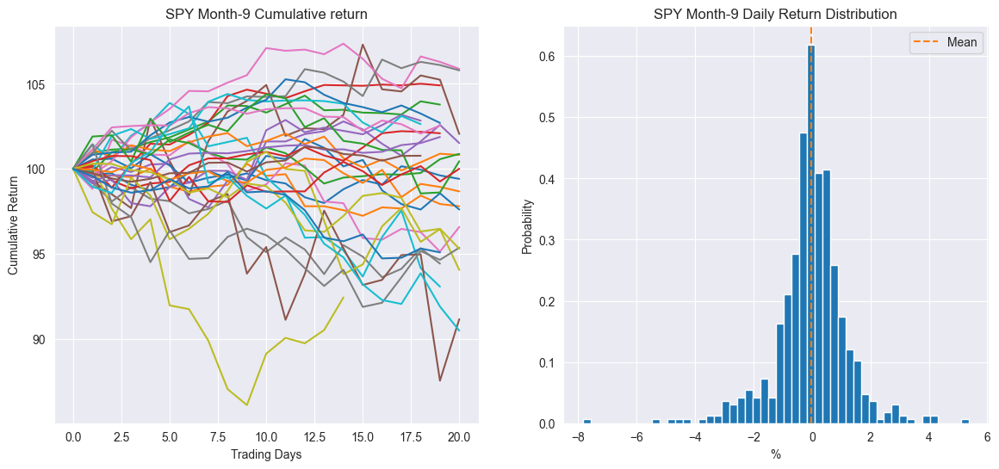

Mean: -0.03261175366941198, Std: 1.2087317625534189
Skewness: -0.5931921898175979, Kurtosis: 5.2824504453297045
Jarque-Bera test p-value: 1.0822470534342249e-164
p_value < 0.05, the distribution is likely not normal


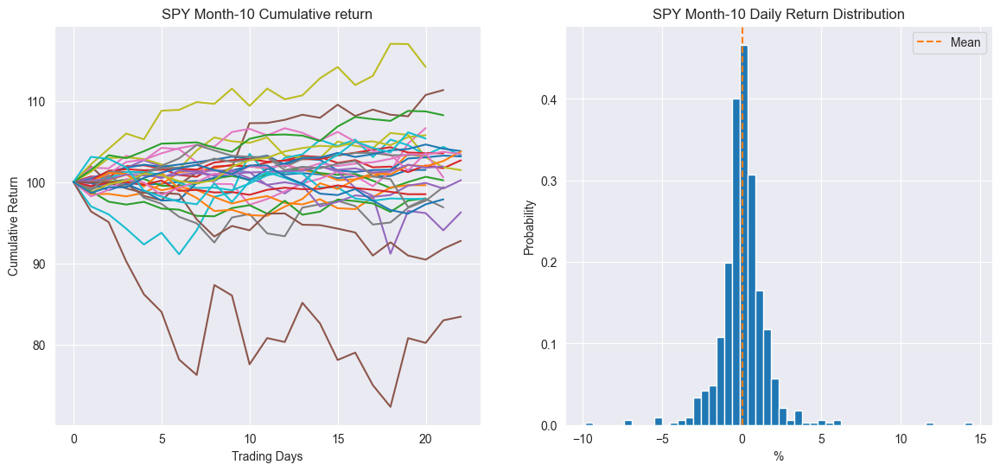

Mean: 0.0841144560354785, Std: 1.5524262344096893
Skewness: 1.1878007543520552, Kurtosis: 19.5027183349052
Jarque-Bera test p-value: 0.0
p_value < 0.05, the distribution is likely not normal


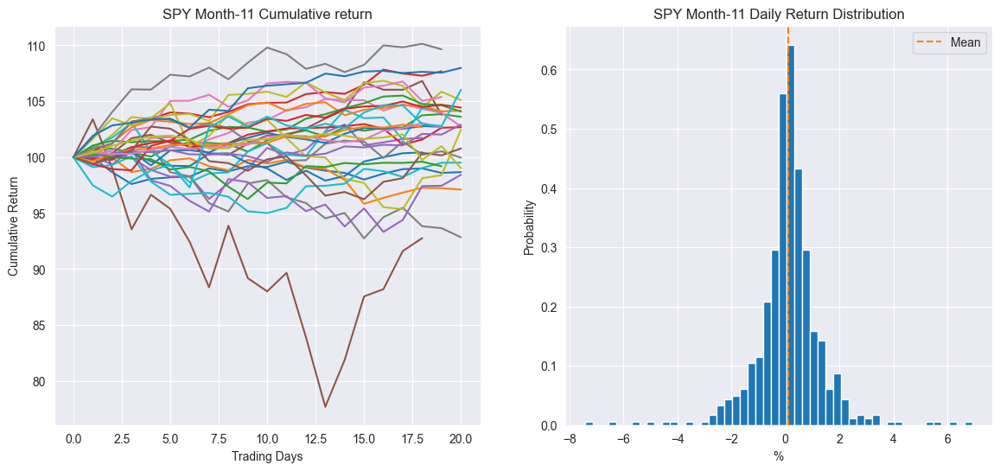

Mean: 0.11972722455881687, Std: 1.2234202722728171
Skewness: -0.2465623997610995, Kurtosis: 8.068341346494517
Jarque-Bera test p-value: 0.0
p_value < 0.05, the distribution is likely not normal


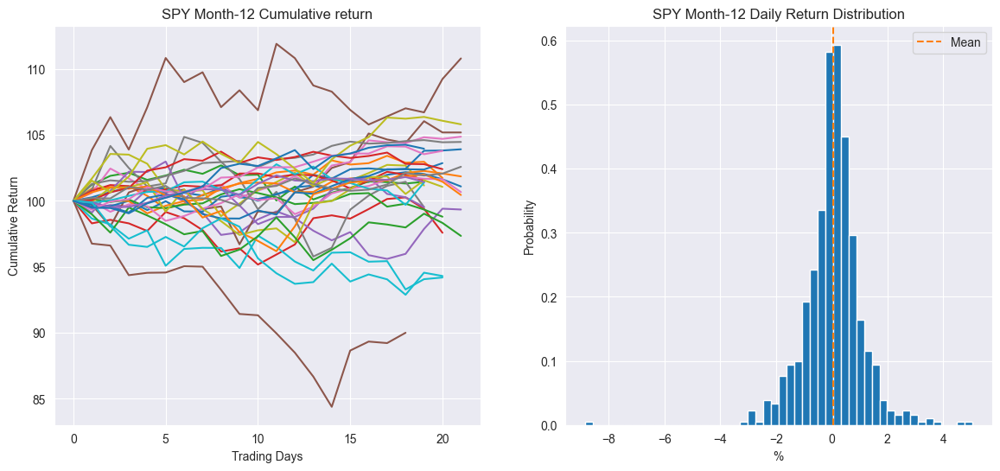

Mean: 0.05504137362635577, Std: 1.0534195262296127
Skewness: -0.5671537906521841, Kurtosis: 9.455624343839657
Jarque-Bera test p-value: 0.0
p_value < 0.05, the distribution is likely not normal


In [4]:
daily_ret_data = dict()

for _df in df.groupby(df.index.month):
    plt.figure(figsize=(14, 6))
    plt.subplot(1, 2, 1)
    temp_df = _df[1]['Adj Close']
    temp_df.name = _df[0]
    returns = _df[1]['Return'] * 100
    daily_ret_data[_df[0]] = returns
    this_month_mean = returns.mean()
    this_month_std = returns.std(ddof=1)  # degree of freedom - 1 for better accuracy    
    
    for _df_1 in temp_df.groupby(temp_df.index.year):
        temp_df_1 = _df_1[1]
        temp_df_1 = temp_df_1 / temp_df_1.iloc[0]
        plt.plot(range(temp_df_1.shape[0]), (100 * temp_df_1).values.tolist())
        
    plt.title(f'{name} Month-{_df[0]} Cumulative return')
    plt.xlabel('Trading Days')
    plt.ylabel('Cumulative Return')
    
    plt.subplot(1, 2, 2)
    plt.hist(returns.values.tolist(), bins=50, density=True)
    plt.axvline(this_month_mean, label='Mean', linestyle='--', color=colours[1])
    plt.title(f'{name} Month-{_df[0]} Daily Return Distribution')
    plt.xlabel('%')
    plt.ylabel('Probability')
    plt.legend(loc='best')
    plt.show()
    
    # ---- test for normality ----
    x = returns
    print(f'Mean: {x.mean()}, Std: {x.std(ddof=1)}')
    print(f'Skewness: {x.skew()}, Kurtosis: {x.kurtosis()}')
    test_stats, p_value = stats.jarque_bera(x)
    print(f'Jarque-Bera test p-value: {p_value}')
    if p_value < 0.05:
        print('p_value < 0.05, the distribution is likely not normal')
    else:
        print('p_value >= 0.05, the distribution is likely to be normal')
    

Simulate Distribution Using Monte Carlo Methods

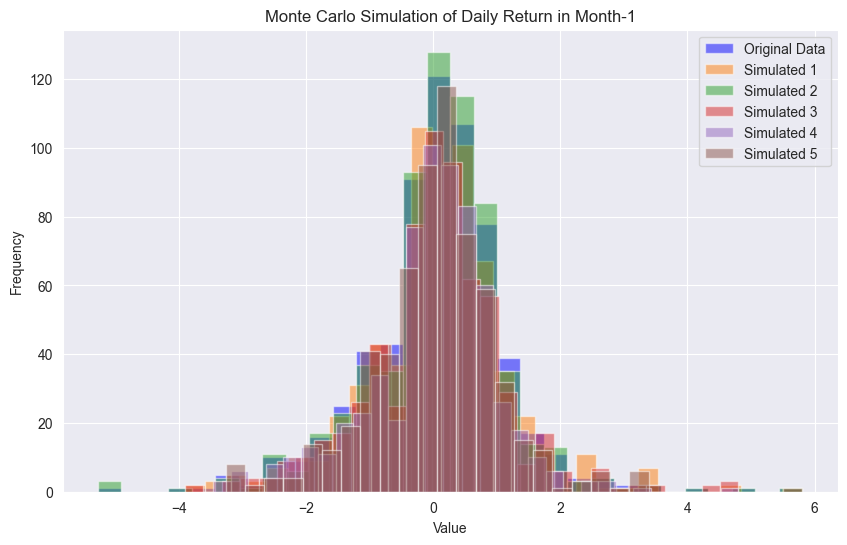

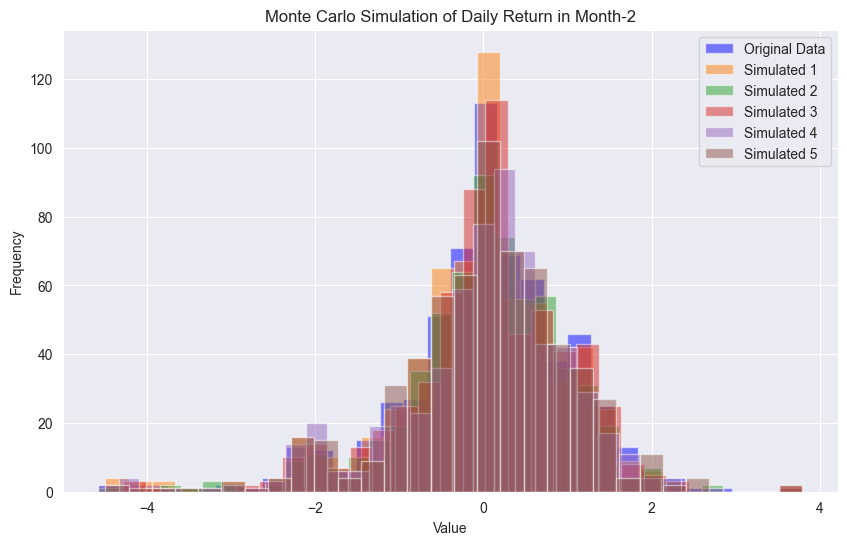

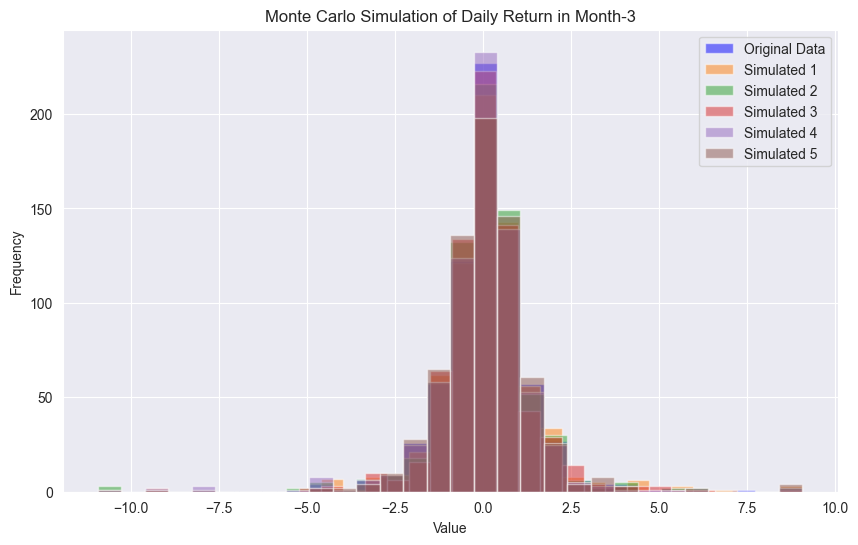

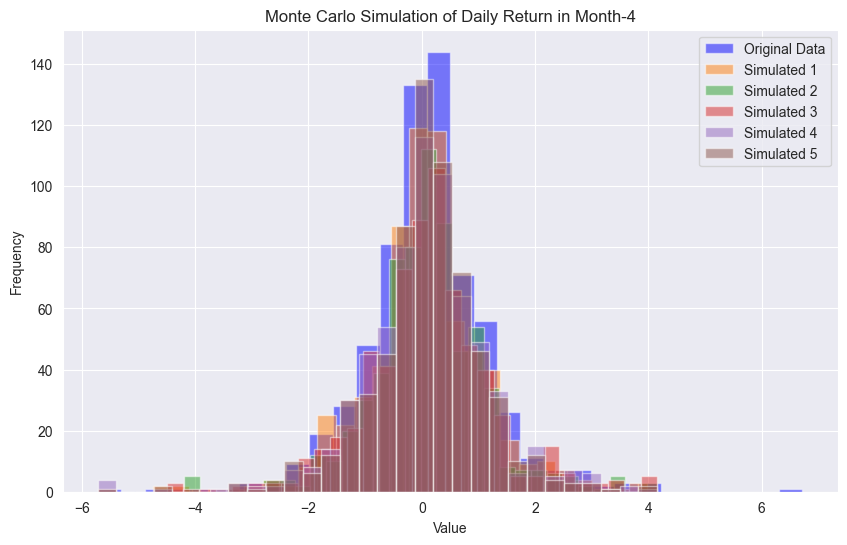

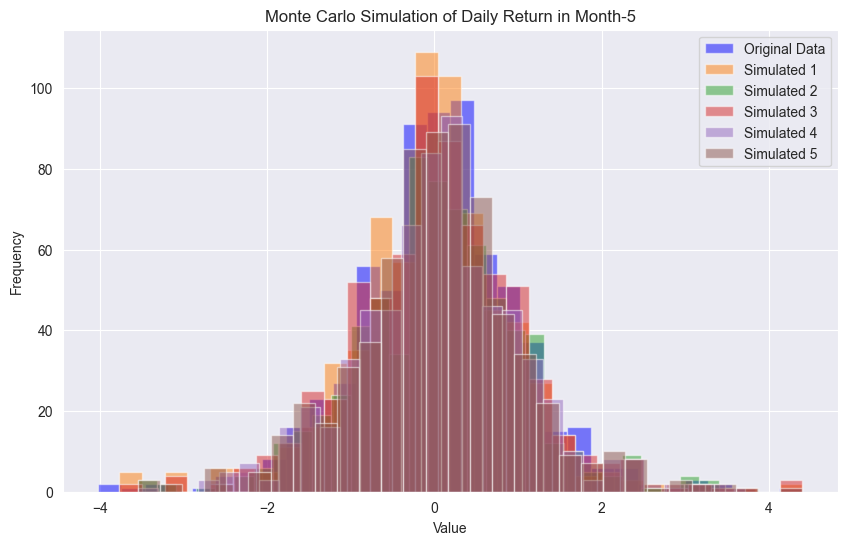

...

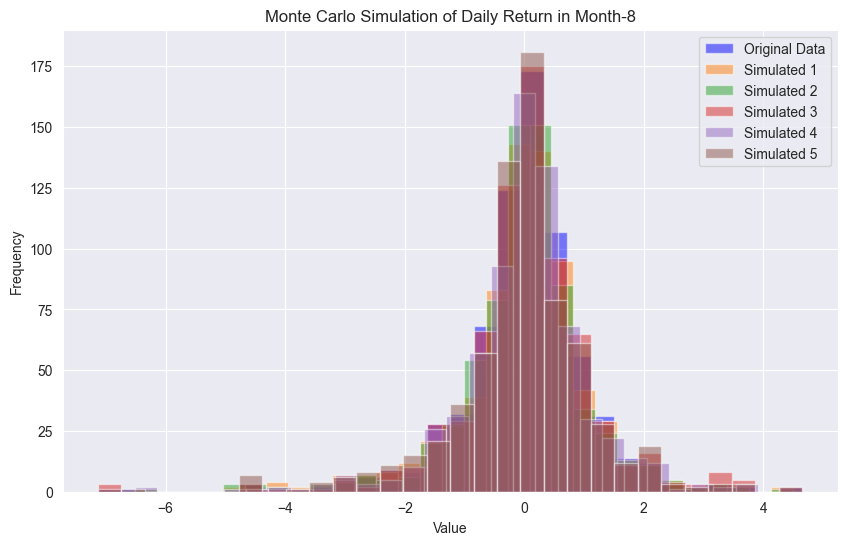

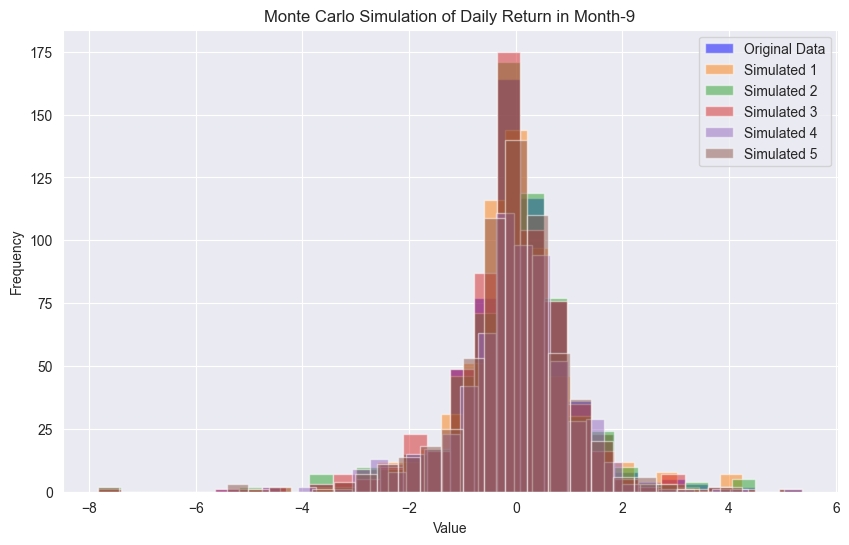

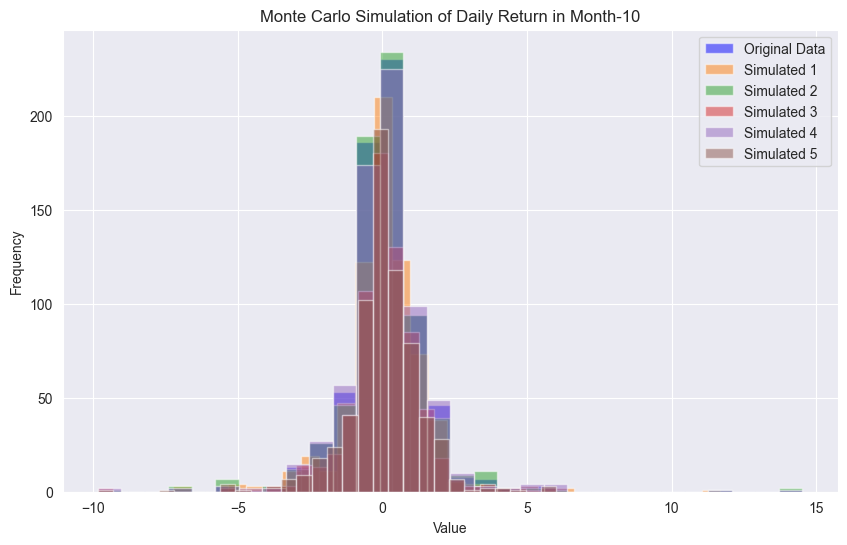

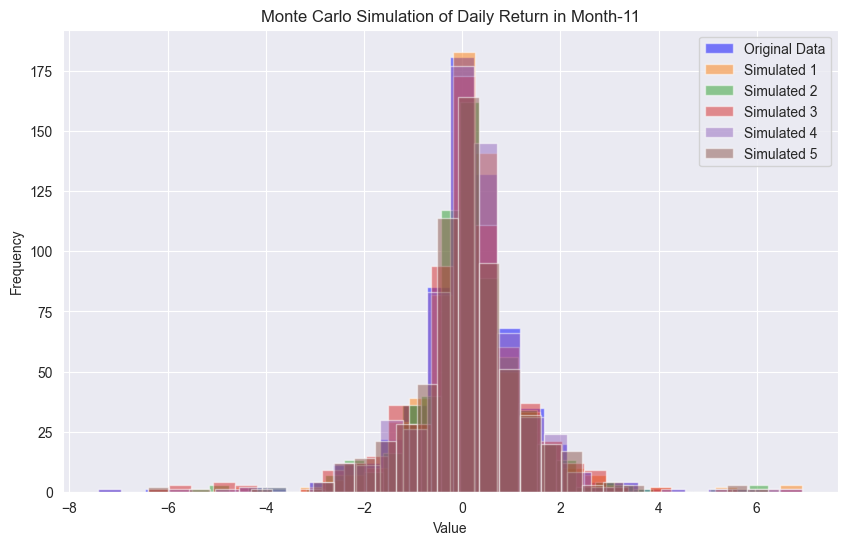

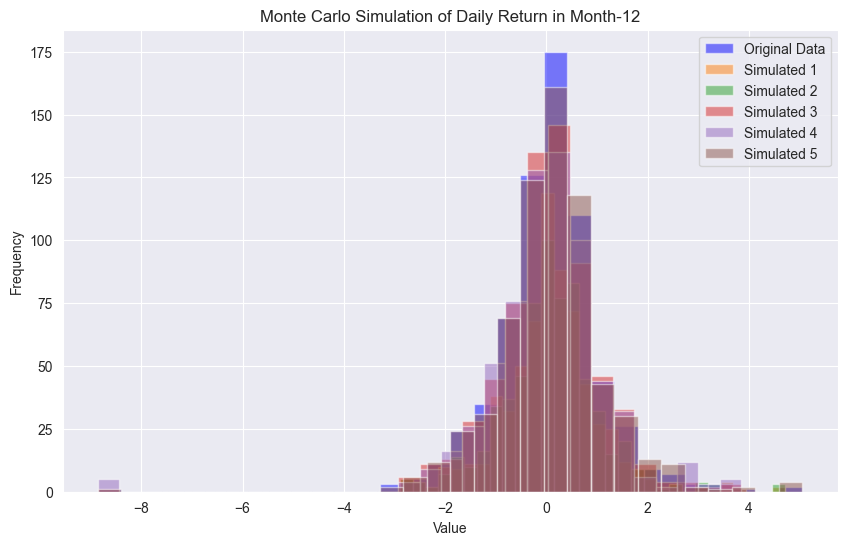

In [5]:
num_simulations = 1000
simulated_m_data = dict()
for key in daily_ret_data:
    simulated_datasets = []
    original_data = daily_ret_data[key]
    # Perform Monte Carlo simulation
    for _ in range(num_simulations):
        # Resample from the original data with replacement
        simulated_data = np.random.choice(original_data, size=len(original_data), replace=True)
        simulated_datasets.append(simulated_data)
    
    # Plot the original data and a few simulated datasets
    plt.figure(figsize=(10, 6))
    plt.hist(original_data, bins=30, alpha=0.5, label="Original Data", color="blue")
    for i in range(5):
        plt.hist(simulated_datasets[i], bins=30, alpha=0.5, label=f"Simulated {i+1}", color=f"C{i+1}")
    plt.xlabel("Value")
    plt.ylabel("Frequency")
    plt.title(f"Monte Carlo Simulation of Daily Return in Month-{key}")
    plt.legend()
    plt.show()
    
    simulated_m_data[key] = simulated_datasets

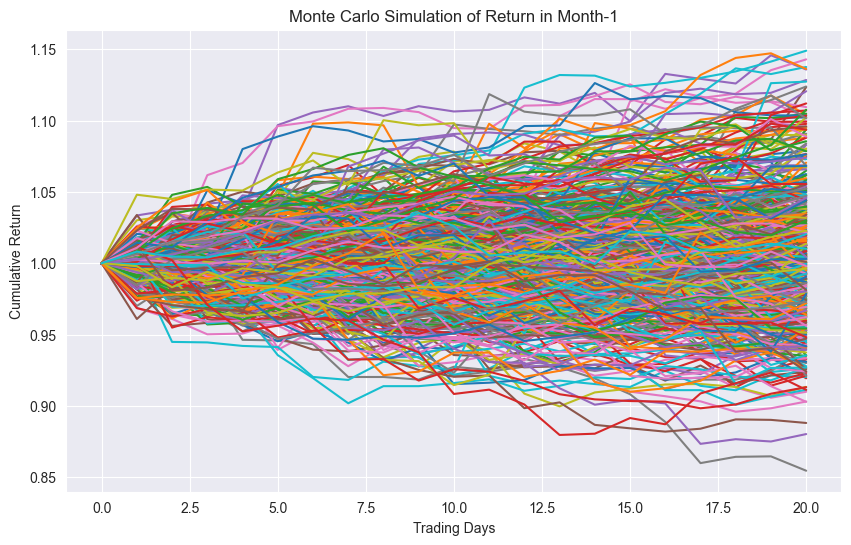

Mean: 0.0541146483485766, Std: 0.905241200252402
Skewness: 0.08382083891840582, Kurtosis: 1.7040634130947678
Jarque-Bera test p-value: 0.6411627301851488
p_value >= 0.05, the distribution is likely to be normal


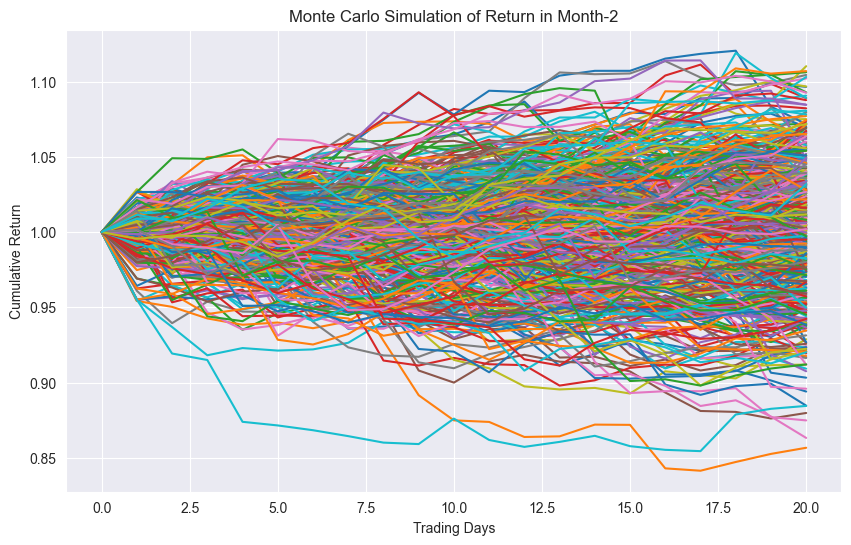

Mean: 0.1624546508468011, Std: 1.0911785411160784
Skewness: -0.15957750324625608, Kurtosis: -0.7013903943676536
Jarque-Bera test p-value: 0.7269956909388671
p_value >= 0.05, the distribution is likely to be normal


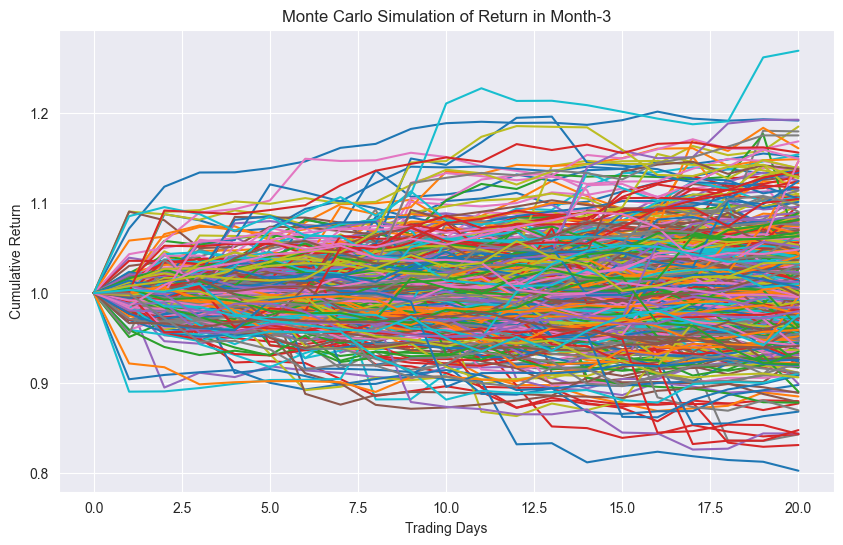

Mean: -0.1075746441321396, Std: 1.7331633172181635
Skewness: 0.29257818127426966, Kurtosis: -0.2127797230849824
Jarque-Bera test p-value: 0.8141525951860219
p_value >= 0.05, the distribution is likely to be normal


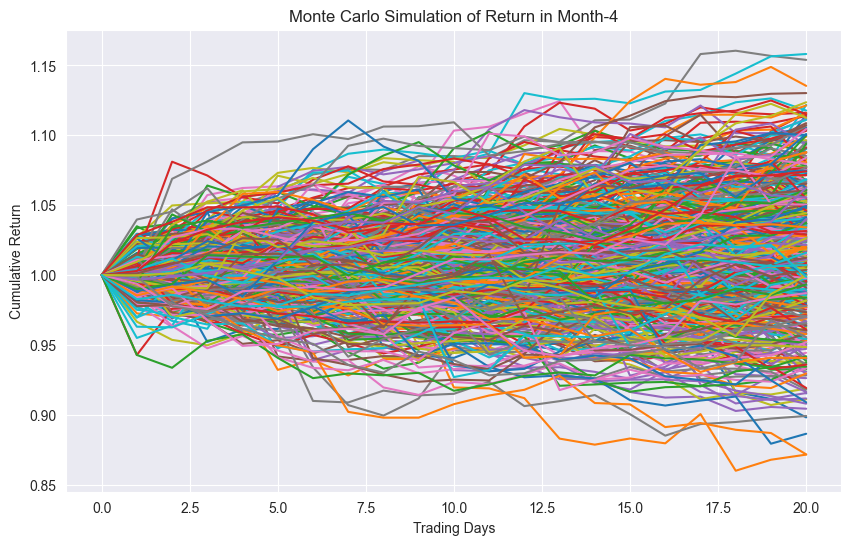

Mean: -0.0029961870562583703, Std: 0.8345057100780541
Skewness: -1.2334664540293592, Kurtosis: 2.162606658076003
Jarque-Bera test p-value: 0.052480315549688274
p_value >= 0.05, the distribution is likely to be normal


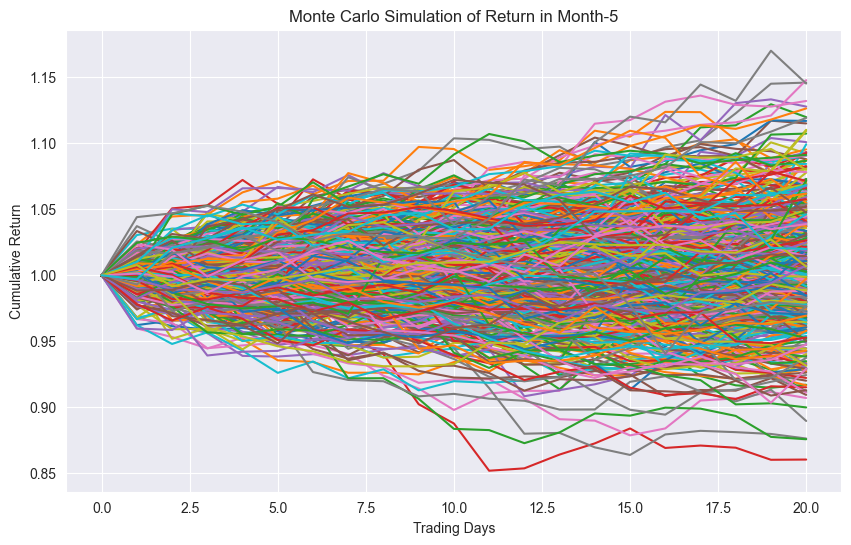

Mean: 0.10485441037495549, Std: 1.1541555483889276
Skewness: -0.4305276221726874, Kurtosis: 0.6565820102862245
Jarque-Bera test p-value: 0.7533927563877771
p_value >= 0.05, the distribution is likely to be normal


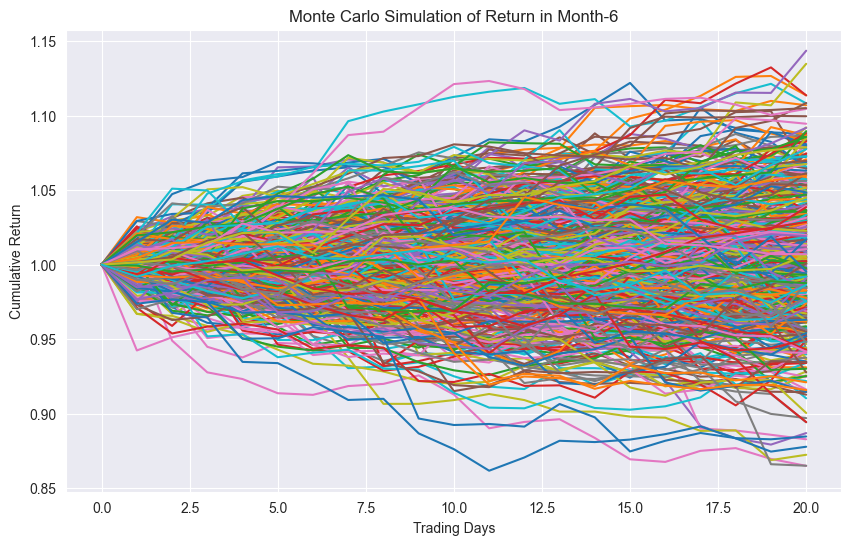

Mean: -0.06620434207471992, Std: 0.7693279288132087
Skewness: -0.46931512022930655, Kurtosis: -0.3158625780373314
Jarque-Bera test p-value: 0.6510710958367207
p_value >= 0.05, the distribution is likely to be normal


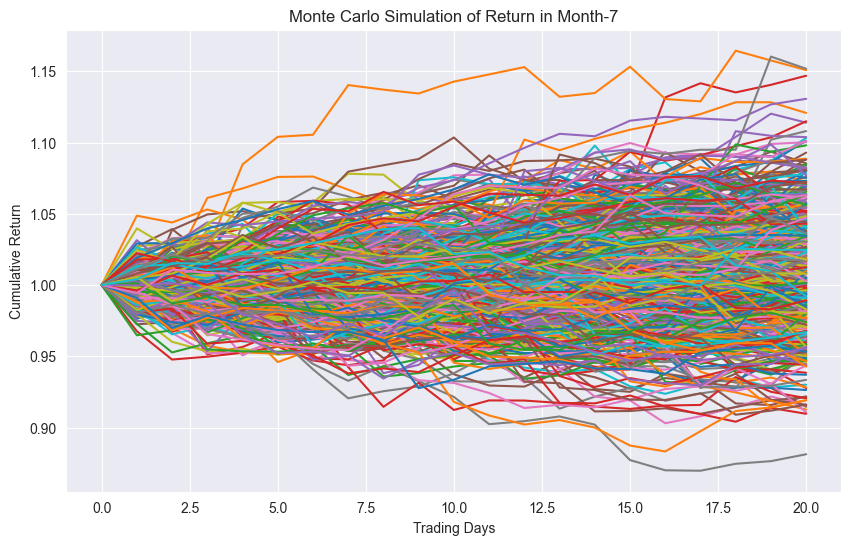

Mean: 0.12549535925088784, Std: 0.8632551173104639
Skewness: 0.7054227264169474, Kurtosis: 3.3544240823930442
Jarque-Bera test p-value: 0.05578872689772112
p_value >= 0.05, the distribution is likely to be normal


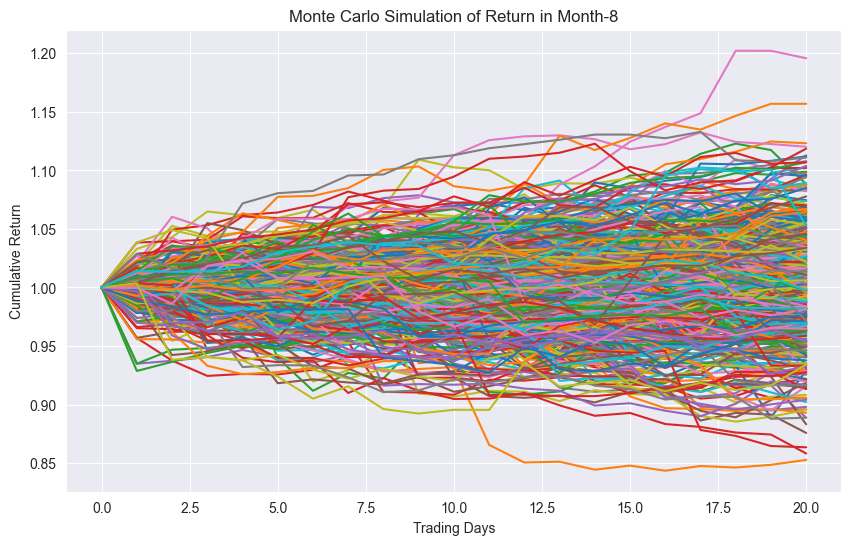

Mean: 0.2710804661104226, Std: 1.6198492578325248
Skewness: -0.25144624905670365, Kurtosis: 4.632496901007917
Jarque-Bera test p-value: 0.010704131191705392
p_value < 0.05, the distribution is likely not normal


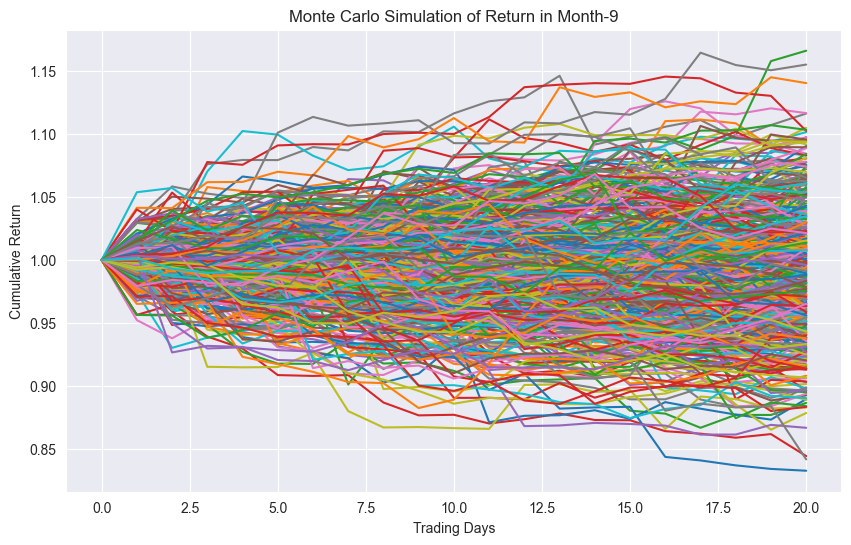

Mean: 0.26541054558667565, Std: 0.9544334092792374
Skewness: 0.532961574254238, Kurtosis: 1.072701035365534
Jarque-Bera test p-value: 0.5922760345741462
p_value >= 0.05, the distribution is likely to be normal


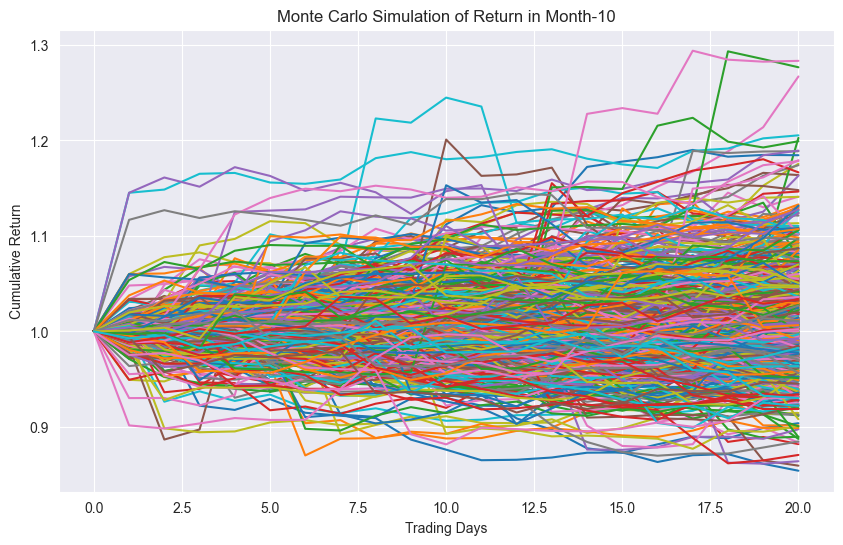

Mean: -0.3554431978164424, Std: 1.1376765489227185
Skewness: -0.8701161925252131, Kurtosis: 0.10504330072900325
Jarque-Bera test p-value: 0.3350689583689633
p_value >= 0.05, the distribution is likely to be normal


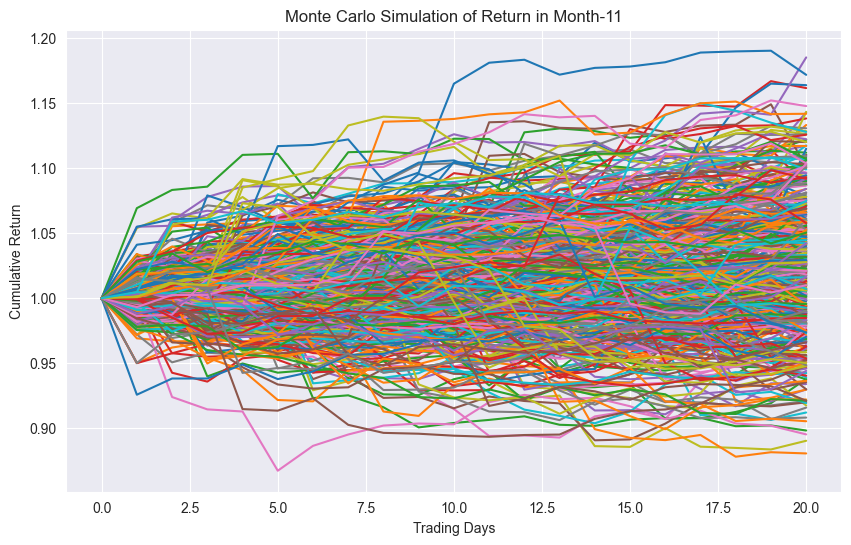

Mean: 0.3695531037003774, Std: 1.3187872603150153
Skewness: 3.0921233479727017, Kurtosis: 11.886969280577732
Jarque-Bera test p-value: 9.735359985866274e-21
p_value < 0.05, the distribution is likely not normal


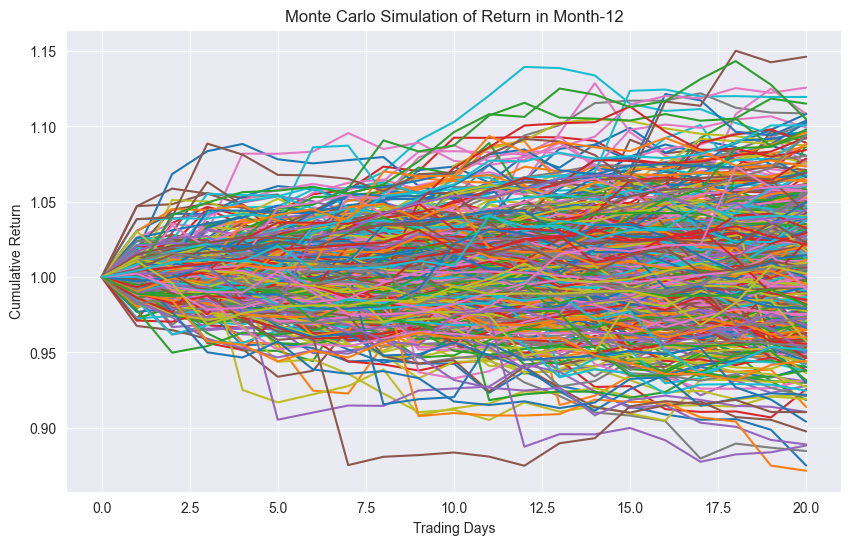

Mean: 0.19943408944145535, Std: 1.01564936861133
Skewness: 1.3700304283759326, Kurtosis: 3.827151337700692
Jarque-Bera test p-value: 0.0037275790455633157
p_value < 0.05, the distribution is likely not normal


In [6]:
num_simulations = 500
for key in daily_ret_data:
    original_data = daily_ret_data[key]
    # Perform Monte Carlo simulation
    plt.figure(figsize=(10, 6))
    m_daily_returns = []
    
    for _ in range(num_simulations):
        # Resample from the original data with replacement
        trading_days = 20
        simulated_data = np.random.choice(original_data, size=trading_days, replace=True)
        simulated_index = [1]
        for i in range(trading_days):
            simulated_index.append(simulated_index[i] * (1 + simulated_data[i] / 100))
            
        plt.plot(simulated_index)
        m_daily_returns = simulated_data
        
    plt.xlabel("Trading Days")
    plt.ylabel("Cumulative Return")
    plt.title(f"Monte Carlo Simulation of Return in Month-{key}")
    plt.show()
    
    # ---- test for normality ----
    x = pd.Series(m_daily_returns)
    print(f'Mean: {x.mean()}, Std: {x.std(ddof=1)}')
    print(f'Skewness: {x.skew()}, Kurtosis: {x.kurtosis()}')
    test_stats, p_value = stats.jarque_bera(x)
    print(f'Jarque-Bera test p-value: {p_value}')
    if p_value < 0.05:
        print('p_value < 0.05, the distribution is likely not normal')
    else:
        print('p_value >= 0.05, the distribution is likely to be normal')

Conclusion: 
- Cannot assume daily returns are random
- Present day's return is affected by previous days' returns